In [2]:
import numpy as np
from numba import njit
from numba_progress import ProgressBar
import matplotlib.pyplot as plt
from tqdm import tqdm
from scipy.special import erf
from matplotlib import animation

Latente warmte L wordt opgenomen binnen de mushy zone met de apparent soortelijke warmte $c^A$. The warmte vergelijking is gedefinieerd als:

$$c^A \frac{\partial T}{\partial t} = \frac{\partial}{\partial x} \left( \lambda_\phi\frac{\partial T}{\partial x} \right)$$

Apparent soortelijke warmte is gedefinieerd:

$$c^A=\theta_s\rho_sc_s+\theta_\ell\rho_\ell c_\ell+[\rho_\ell c_\ell T-\rho_sc_sT+\rho_\ell L]\frac{\partial\theta_\ell}{dT}$$

De verschillende eigenschappen zijn gedefinieerd als:

$$
\left\{\begin{array}{l}
\lambda_\phi = \theta_s\lambda_s + \theta_\ell\lambda_\ell \\
\rho_\phi = \theta_s\rho_s + \theta_\ell\rho_\ell \\
\theta_\ell = \left\{\begin{array}{cl}
        1 & T \geqslant T_m + \Delta T \\
        \frac{T - T_m + \Delta T}{2\Delta T} & T_m - \Delta T < T < T_m + \Delta T \\
        0 & T \leqslant T_m - \Delta T
    \end{array}\right. \\
\theta_s = 1 - \theta_\ell
\end{array}\right.
$$

In de vaste en vloeistof gedeelte de standaard warmte vergelijking geld:

$$\frac{\partial T}{\partial t}=\frac{\lambda}{\rho c}\frac{\partial^2T}{\partial x^2}$$

In het experiment wordt paraffine gebruikt. De stofeigenschappen daarvoor zijn:

|eigenschap|vloeistof|vaste stof|eenheid|
|----------|---------|----------|-------|
|$\lambda$ |0.15     |0.24      |W/m.K  |
|$\rho$    |780      |860       |kg/m^3 |
|$c_p$     |2100     |2900      |J/kg.K |
|$\mu$     |0.205    |-         |Pa.s   |
|$L$|$2.1\times10^5$|$2.1\times10^5$|J/kg|
|$T_m$     |54       |54    |$\degree C$|

Omdat we er verder van uit gaan dat op ieder moment de temperatuur quasistatic is, is the oplossing van de warmte vergelijking in de vloeistof:

$$T(x, t) = T_0 + \left( \frac{T_m + \Delta T - T_0}{s_\ell(t)} \right)x$$

waar:
- $s_\ell(t)$ is het begin van vloeistof [m]
- $T_0$ is de vaste temperatuur waarmee het materiaal wordt opgewarmd [$\degree\text{C}$]

Voor het vaste gedeelte van de stof de oplossing is:

$$T(x, t) = T_m - \Delta T + (T_1 - T_m + \Delta T)\space\text{erf}\left( \frac{x-s_s(t)}{2\sqrt{at}} \right)$$

waar:
- $s_\ell(t)$ is het begin van de vaste stof [m]
- $T_1$ is de omgeving temperatuur [$\degree\text{C}$]

Als laatste moet er gekeken worden naar de $\lambda_\phi$ term in de warmte vergelijking in de mush:

$$
\begin{align}
\frac{\partial}{\partial x}\left( \lambda_\phi \frac{\partial T}{\partial x} \right)
&= \frac{\partial\lambda_\phi}{\partial x}\frac{\partial T}{\partial x} + \lambda_\phi \frac{\partial^2 T}{\partial x^2} \\
&= \left[ \lambda_s \frac{\partial\theta_s}{\partial x} + \lambda_\ell \frac{\partial\theta_\ell}{\partial x} \right]\frac{\partial T}{\partial x} + \lambda_\phi \frac{\partial^2 T}{\partial x^2}
\end{align}
$$

Hier kan $\frac{\partial\theta_s}{\partial x}$ herschreven worden als:

$$\frac{\partial\theta_s}{\partial x} = \frac{\partial}{\partial x}(1 - \theta_\ell) = -\frac{\partial\theta_\ell}{\partial x}$$

Terugstoppen in de vergelijking levert:

$$c^A \frac{\partial T}{\partial t}=(\lambda_\ell - \lambda_s) \frac{\partial\theta_\ell}{\partial x}\frac{\partial T}{\partial x} + (\theta_s\lambda_s + \theta_\ell\lambda_\ell)\frac{\partial^2 T}{\partial x^2}$$

We kunnen verder $\frac{\partial\theta_\ell}{\partial T}$ helemaal wegwerken met de kettingregel:

$$\frac{\partial\theta_\ell}{\partial x} = \frac{\partial\theta_\ell}{\partial T}\frac{\partial T}{\partial x}$$

Binnen het mush is $\frac{\partial\theta_\ell}{\partial T}$ gewoon:

$$\frac{\partial\theta_\ell}{\partial T} = \frac{\partial}{\partial T}\left[ \frac{T - T_m + \Delta T}{2\Delta T} \right] = \frac{1}{2\Delta T}$$

De vergelijking is nu:

$$c^A \frac{\partial T}{\partial t}=\frac{\lambda_\ell - \lambda_s}{2\Delta T}\left (\frac{\partial T}{\partial x}\right)^2 + (\theta_s\lambda_s + \theta_\ell\lambda_\ell)\frac{\partial^2 T}{\partial x^2}$$

Voor het oplossen van de vergelijking wordt in stappen de vergelijking opgelost met FTCS:

$$T^{n+1}_i\approx T^{n+1}_i + \frac{\lambda_\ell - \lambda_s}{2c^A\Delta T}\Delta t\left( \frac{T^n_{i+1} - T^n_{i-1}}{2\Delta x} \right)^2+\frac{\theta_s\lambda_s + \theta_\ell\lambda_\ell}{c^A}\frac{\Delta t}{(\Delta x)^2} [T^n_{i+1} + T^n_{i-1} - 2T^n_i]$$

In [3]:
Tm      = 54.        # *C
dT      = 5.         # *C
T0      = 100.       # *C
T1      = 20.        # *C
dx      = 1e-4       # m
dt      = 1e-4       # s
L       = 2.1e5      # J/kg
rho_l   = 780.       # kg/m^3
rho_s   = 860.       # kg/m^3
lam_l   = 0.15       # W/K m
lam_s   = 0.24       # W/K m
c_l     = 2100.      # J/kg K
c_s     = 2900.      # J/kg K
w       = 1e-1       # m

a_s = lam_s / (rho_s * c_s)

@njit
def theta_l(T):
    return (T - Tm + dT) / 2 / dT

@njit
def c_A(T):
    return (1 - theta_l(T)) * rho_s * c_s + theta_l(T) * rho_l * c_l + (rho_l * c_l * T - rho_s * c_s * T + rho_l * L) / 2 / dT

@njit
def T_liquid(x, s):
    return T0 + (Tm + dT - T0) / s * x

@njit
def T_solid(x, t, s):
    if t == 0:
        return np.full(x.size, T1)
    result = np.empty_like(x)
    Tl = T0 if s == 0 else Tm - dT
    for i in range(x.size):
        result[i] = Tl + (T1 - Tl) * erf((x[i] - s) / 2 / np.sqrt(a_s * t))
    return result

@njit
def dT_mush(T):
    return (lam_l - lam_s) / 2 / c_A(T[1:-1]) / dT * dt * ((T[2:] - T[:-2]) / 2 / dx)**2 + ((1-theta_l(T[1:-1])) * lam_s + theta_l(T[1:-1]) * lam_l) / c_A(T[1:-1]) * dt / dx**2 * (T[2:] + T[:-2] - 2 * T[1:-1])

@njit(nogil=True)
def solve_equation(x, N, progress):
    T = np.full(x.size, T1)

    for i in range(N):
        mush_mask = (Tm - dT < T) & (T < Tm + dT)
        solid_mask = T <= Tm - dT
        liquid_mask = T >= Tm + dT
        if mush_mask.sum() > 3:
            T[mush_mask] += dT_mush(T[np.where(mush_mask)[0][0]-1:np.where(mush_mask)[0][-1]+2])
        
        if liquid_mask.sum() > 1:
            T[liquid_mask] = T_liquid(x[liquid_mask], x[mush_mask][0])

        s_s = x[mush_mask][-1] if mush_mask.sum() > 3 else 0
        T[solid_mask] = T_solid(x[solid_mask], i * dt, s_s)
        T[0] = T0
        progress.update(1)
    
    print(x[mush_mask])
    
    return T

x = np.arange(0, w, dx)
t1 = 100.
N = int(t1 / dt)
with ProgressBar(total=N) as progress:
    T = solve_equation(x, N, progress)

  0%|          | 0/1000000 [00:00<?, ?it/s]

[0.0019 0.002  0.0021 0.0022 0.0023 0.0024]


(0.0, 0.02)

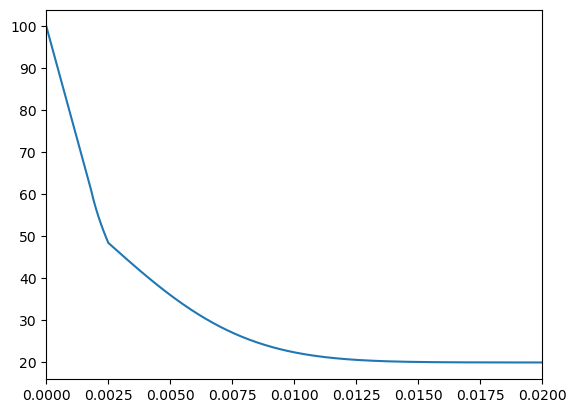

In [4]:
plt.plot(x, T)
plt.xlim(0, 0.02)

In [6]:
Tm      = 54.        # *C
dT      = 5.         # *C
T0      = 100.       # *C
T1      = 20.        # *C
dx      = 1e-4       # m
dt      = 1e-4       # s
L       = 2.1e5      # J/kg
rho_l   = 780.       # kg/m^3
rho_s   = 860.       # kg/m^3
lam_l   = 0.15       # W/K m
lam_s   = 0.24       # W/K m
c_l     = 2100.      # J/kg K
c_s     = 2900.      # J/kg K
w       = 1e-1       # m

a_s = lam_s / (rho_s * c_s)
a_l = lam_l / (rho_l * c_l)

@njit
def theta_l(T):
    return (T - Tm + dT) / 2 / dT

@njit
def c_A(T):
    return (1 - theta_l(T)) * rho_s * c_s + theta_l(T) * rho_l * c_l + (rho_l * c_l * T - rho_s * c_s * T + rho_l * L) / 2 / dT

@njit
def T_liquid(x, s):
    return T0 + (Tm + dT - T0) / s * x

@njit
def T_solid(x, t, s):
    if t == 0:
        return np.full(x.size, T1)
    result = np.empty_like(x)
    Tl = T0 if s == 0 else Tm - dT
    for i in range(x.size):
        result[i] = Tl + (T1 - Tl) * erf((x[i] - s) / 2 / np.sqrt(a_s * t))
    return result

@njit
def dT_liquid(T):
    return a_l * dt / dx**2 * (T[2:] + T[:-2] - 2 * T[1:-1])

@njit
def dT_solid(T):
    return a_s * dt / dx**2 * (T[2:] + T[:-2] - 2 * T[1:-1])

@njit
def dT_mush(T):
    return (lam_l - lam_s) / 2 / c_A(T[1:-1]) / dT * dt * ((T[2:] - T[:-2]) / 2 / dx)**2 + ((1-theta_l(T[1:-1])) * lam_s + theta_l(T[1:-1]) * lam_l) / c_A(T[1:-1]) * dt / dx**2 * (T[2:] + T[:-2] - 2 * T[1:-1])

@njit(nogil=True)
def solve_equation(x, N, progress):
    N_save = 100
    T_list = np.empty((N_save, x.size))
    T = np.full(x.size, T1)
    T[0] = T0
    T_new = T.copy()

    for i in range(N):
        mush_mask = (Tm - dT < T) & (T < Tm + dT)
        solid_mask = T <= Tm - dT
        liquid_mask = T >= Tm + dT
        
        if np.any(mush_mask):
            left, right = np.where(mush_mask)[0][0], np.where(mush_mask)[0][-1]
            T_new[left:right+1] = T[left:right+1] + dT_mush(T[left-1:right+2])

        left, right = np.where(solid_mask)[0][0], 998
        T_new[left:right+1] = T[left:right+1] + dT_solid(T[left-1:right+2])

        if liquid_mask.sum() > 1:
            left, right = 1, np.where(liquid_mask)[0][-1]
            T_new[left:right+1] = T[left:right+1] + dT_solid(T[left-1:right+2])
        T, T_new = T_new, T
        if i < N_save:
            T_list[i] = T
        progress.update(1)
    
    return T_list

x = np.arange(0, w, dx)
t1 = 1.
N = int(t1 / dt)
with ProgressBar(total=N) as progress:
    T = solve_equation(x, N, progress)

  0%|          | 0/10000 [00:00<?, ?it/s]

100%|██████████| 100/100 [00:04<00:00, 21.30it/s]


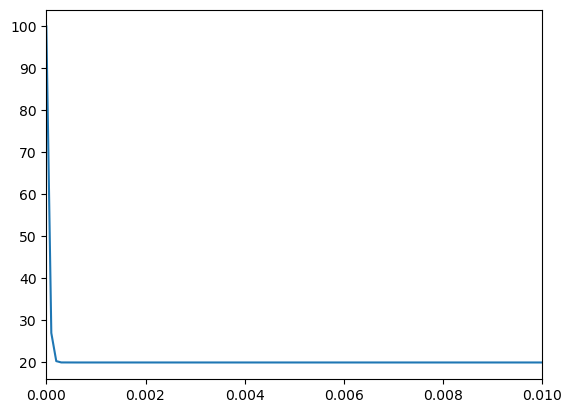

In [11]:
fig, ax = plt.subplots()

img, = ax.plot(x, T[0])
plt.xlim(0, 0.01)

def update(frame):
    img.set_data(x, T[frame])
    return [img]

ani = animation.FuncAnimation(fig, update, frames=T.shape[0], blit=True, interval=dt * 1e3)
with tqdm(total=T.shape[0]) as pbar:
    ani.save('my_animation.mp4', fps=20, progress_callback=lambda i, n: pbar.update(1))
plt.show()

In [8]:
Tm      = 54.        # *C
dT      = 5.         # *C
T0      = 100.       # *C
T1      = 20.        # *C
dx      = 1e-4       # m
dt      = 1e-4       # s
L       = 2.1e5      # J/kg
rho_l   = 780.       # kg/m^3
rho_s   = 860.       # kg/m^3
lam_l   = 0.15       # W/K m
lam_s   = 0.24       # W/K m
c_l     = 2100.      # J/kg K
c_s     = 2900.      # J/kg K
w       = 1e-1       # m

a_s = lam_s / (rho_s * c_s)
a_l = lam_l / (rho_l * c_l)

# @njit
def theta_l(T):
    return (T - Tm + dT) / 2 / dT

# @njit
def c_A(T):
    return (1 - theta_l(T)) * rho_s * c_s + theta_l(T) * rho_l * c_l + (rho_l * c_l * T - rho_s * c_s * T + rho_l * L) / 2 / dT

# @njit
def T_liquid(x, s):
    return T0 + (Tm + dT - T0) / s * x

# @njit
def T_solid(x, t, s):
    if t == 0:
        return np.full(x.size, T1)
    result = np.empty_like(x)
    Tl = T0 if s == 0 else Tm - dT
    for i in range(x.size):
        result[i] = Tl + (T1 - Tl) * erf((x[i] - s) / 2 / np.sqrt(a_s * t))
    return result

# @njit
def dT_liquid(T):
    return a_l * dt / dx**2 * (T[2:] + T[:-2] - 2 * T[1:-1])

# @njit
def dT_solid(T):
    return a_s * dt / dx**2 * (T[2:] + T[:-2] - 2 * T[1:-1])

# @njit
def dT_mush(T):
    return (lam_l - lam_s) / 2 / c_A(T[1:-1]) / dT * dt * ((T[2:] - T[:-2]) / 2 / dx)**2 + ((1-theta_l(T[1:-1])) * lam_s + theta_l(T[1:-1]) * lam_l) / c_A(T[1:-1]) * dt / dx**2 * (T[2:] + T[:-2] - 2 * T[1:-1])

# @njit(nogil=True)
def solve_equation(x, N, progress):
    T = np.full(x.size, T1)
    T[0] = T0
    T_new = T.copy()

    for i in tqdm(range(N)):
        mush_mask = (Tm - dT < T) & (T < Tm + dT)
        solid_mask = T <= Tm - dT
        liquid_mask = T >= Tm + dT
        
        if np.any(mush_mask):
            left, right = np.where(mush_mask)[0][0], np.where(mush_mask)[0][-1]
            T_new[left:right+1] = T[left:right+1] + dT_mush(T[left-1:right+2])

        left, right = np.where(solid_mask)[0][0], 998
        T_new[left:right+1] = T[left:right+1] + dT_solid(T[left-1:right+2])

        if liquid_mask.sum() > 1:
            left, right = 1, np.where(liquid_mask)[0][-1]
            T_new[left:right+1] = T[left:right+1] + dT_solid(T[left-1:right+2])
        T, T_new = T_new, T
        # progress.update(1)
    
    return T

x = np.arange(0, w, dx)
t1 = 1000.
N = int(t1 / dt)
# with ProgressBar(total=N) as progress:
T = solve_equation(x, N, None)

  1%|          | 106796/10000000 [00:13<20:32, 8026.43it/s]


KeyboardInterrupt: 

  0%|          | 0/300000 [00:00<?, ?it/s]

100%|██████████| 600/600 [00:29<00:00, 20.65it/s]


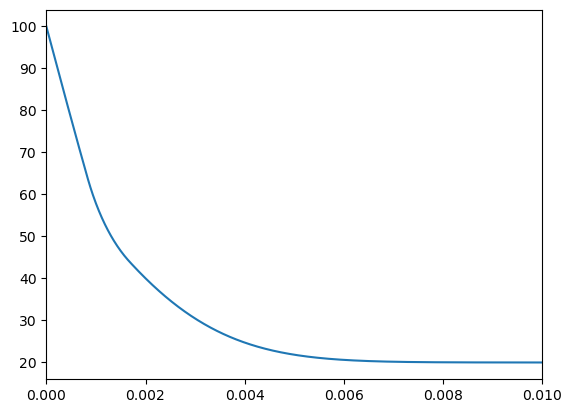

In [22]:
import numpy as np
from numba import njit
from numba_progress import ProgressBar
import matplotlib.pyplot as plt
from tqdm import tqdm
from scipy.special import erf
from matplotlib import animation
from IPython.display import HTML

Tm      = 54.        # *C
dT      = 10.        # *C
T0      = 100.       # *C
T1      = 20.        # *C
dx      = 1e-5       # m
dt      = 1e-4       # s
L       = 2.1e5      # J/kg
rho_l   = 780.       # kg/m^3
rho_s   = 860.       # kg/m^3
lam_l   = 0.15       # W/K m
lam_s   = 0.24       # W/K m
c_l     = 2100.      # J/kg K
c_s     = 2900.      # J/kg K
w       = 1e-2       # m

a_s = lam_s / (rho_s * c_s)
a_l = lam_l / (rho_l * c_l)

@njit
def theta_l(T):
    return (T - Tm + dT) / 2 / dT

@njit
def c_A(T):
    return (1 - theta_l(T)) * rho_s * c_s + theta_l(T) * rho_l * c_l + (rho_l * c_l * T - rho_s * c_s * T + rho_l * L) / 2 / dT

@njit
def T_liquid(x, s):
    return T0 + (Tm + dT - T0) / s * x

@njit
def T_solid(x, t, s):
    if t == 0:
        return np.full(x.size, T1)
    result = np.empty_like(x)
    Tl = T0 if s == 0 else Tm - dT
    for i in range(x.size):
        result[i] = Tl + (T1 - Tl) * erf((x[i] - s) / 2 / np.sqrt(a_s * t))
    return result

@njit
def dT_liquid(T):
    return a_l * dt / dx**2 * (T[2:] + T[:-2] - 2 * T[1:-1])

@njit
def dT_solid(T):
    return a_s * dt / dx**2 * (T[2:] + T[:-2] - 2 * T[1:-1])

@njit
def dT_mush(T):
    return (lam_l - lam_s) / 2 / c_A(T[1:-1]) / dT * dt * ((T[2:] - T[:-2]) / 2 / dx)**2 + ((1-theta_l(T[1:-1])) * lam_s + theta_l(T[1:-1]) * lam_l) / c_A(T[1:-1]) * dt / dx**2 * (T[2:] + T[:-2] - 2 * T[1:-1])

@njit(nogil=True)
def solve_equation(x, N, progress):
    T_list = np.empty((N, x.size))
    T = np.full(x.size, T1)
    T[0] = T0
    T_new = T.copy()

    for i in range(N):
        mush_mask = (Tm - dT < T) & (T < Tm + dT)
        solid_mask = T <= Tm - dT
        liquid_mask = T >= Tm + dT
        
        if np.any(mush_mask):
            left, right = np.where(mush_mask)[0][0], np.where(mush_mask)[0][-1]
            T_new[left:right+1] = T[left:right+1] + dT_mush(T[left-1:right+2])

        left, right = np.where(solid_mask)[0][0], 998
        T_new[left:right+1] = T[left:right+1] + dT_solid(T[left-1:right+2])

        if liquid_mask.sum() > 1:
            left, right = 1, np.where(liquid_mask)[0][-1]
            T_new[left:right+1] = T[left:right+1] + dT_solid(T[left-1:right+2])
        T, T_new = T_new, T
        T_list[i] = T
        progress.update(1)
    
    return T_list

x = np.arange(0, w, dx)
t1 = 30.
N = int(t1 / dt)
with ProgressBar(total=N) as progress:
    T = solve_equation(x, N, progress)

fig, ax = plt.subplots()

img, = ax.plot(x, T[0])
plt.xlim(0, 0.01)
fps = 20
t_fps = 1 / fps / dt
frames = np.where(np.arange(T.shape[0], dtype=int) % t_fps == 0)[0]

def update(frame):
    img.set_data(x, T[frame])
    return [img]

ani = animation.FuncAnimation(fig, update, frames=frames, blit=True, interval=1e3/fps)
with tqdm(total=len(frames)) as pbar:
    ani.save('my_animation.mp4', fps=fps, progress_callback=lambda i, n: pbar.update(1))

HTML(ani.to_jshtml())

In [ ]:
import numpy as np

Tm      = 54.        # *C
dT      = 2.        # *C
T1      = 20.        # *C
dx      = 1e-5       # m
dt      = 1e-4       # s
L       = 2.1e5      # J/kg
rho_l   = 780.       # kg/m^3
rho_s   = 860.       # kg/m^3
lam_l   = 0.15       # W/K m
lam_s   = 0.24       # W/K m
c_l     = 2100.      # J/kg K
c_s     = 2900.      # J/kg K
w       = 1e-2       # m
min_mush = 0

a_s = lam_s / (rho_s * c_s)
a_l = lam_l / (rho_l * c_l)

def theta_l(T, dT):
    return (T - Tm + dT) / 2 / dT

def full_theta_l(T, dT):
    # different zones
    mush_mask = (Tm - dT < T) & (T < Tm + dT)
    solid_mask = T <= Tm - dT
    liquid_mask = T >= Tm + dT

    theta = np.zeros_like(T)
    theta[solid_mask] = 0
    theta[liquid_mask] = 1
    theta[mush_mask] = theta_l(T[mush_mask], dT)
    return theta

def lam_phi(T, dT):
    return full_theta_l(T, dT) * lam_l + (1 - full_theta_l(T, dT)) * lam_s

def c_A(T, dT):
    return (1 - theta_l(T[1:-1], dT)) * rho_s * c_s \
        + theta_l(T[1:-1], dT) * rho_l * c_l \
        + ((T[:-2] < Tm + dT) & (T[2:] > Tm - dT)) * ((rho_l * c_l - rho_s * c_s) * T[1:-1] + rho_l * L) * (full_theta_l(T[2:], dT) - full_theta_l(T[:-2], dT)) / (T[2:] - T[:-2])

# discrete timestep of mushy zone
def dT_mush(T, dT):
    return dt / (2 * dx**2 * c_A(T, dT)) * ((lam_phi(T[2:], dT) + lam_phi(T[1:-1], dT)) * T[2:] \
        + (lam_phi(T[:-2], dT) + lam_phi(T[1:-1], dT)) * T[:-2] \
        - (lam_phi(T[2:], dT) + lam_phi(T[:-2], dT) + 2 * lam_phi(T[1:-1], dT)) * T[1:-1])

def mush_a(T, dT):
    return (lam_phi(T[2:], dT) + lam_phi(T[1:-1], dT)) / 2 / c_A(T, dT)
# def dT_mush(T, dT):
#     lam_right = 0.5 * (lam_phi(T[2:], dT) + lam_phi(T[1:-1], dT))  # λ_{i+1/2}
#     lam_left  = 0.5 * (lam_phi(T[:-2], dT) + lam_phi(T[1:-1], dT))  # λ_{i-1/2}
    
#     T_new = (lam_right * (T[2:] - T[1:-1]) - lam_left * (T[1:-1] - T[:-2])) / dx**2
#     return dt * T_new / c_A(T[1:-1], dT)


def dT_solid(T):
    return a_s * dt / dx**2 * (T[2:] + T[:-2] - 2 * T[1:-1])

def dT_liquid(T):
    return a_l * dt / dx**2 * (T[2:] + T[:-2] - 2 * T[1:-1])

print(theta_l(54.41527144476289, dT), a_s, mush_a(np.array([69.61017922087105, 54.41527144476289, 54.258369122958044]), dT), lam_phi(np.array([69.61017922087105, 54.41527144476289, 54.258369122958044]), dT))
print(lam_phi(np.array([54.258369122958044]), dT))
dT_mush(np.array([69.61017922087105, 54.41527144476289, 54.258369122958044]), dT)
# dT_liquid(np.array([69.61017922087105, 54.41527144476289, 54.258369122958044]))

0.6038178611907217 9.623095429029671e-08 [9.47946582e-08] [0.15       0.18565639 0.18918669]
[0.18918669]


array([1.27494128])